In [34]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy import fftpack
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import sys
sys.float_repr_style ='plain'

In [2]:
#Counting missing values in gas consumption
data = pd.read_csv('Dataset H.csv', delimiter= ";")
missing_vol_mwh = data['vol_mwh'].isnull().sum()
print("Number of missing values in 'vol_mwh' column:", missing_vol_mwh)

Number of missing values in 'vol_mwh' column: 15


In [3]:
# Backward fill missing values for the column "vol_mwh"
data['vol_mwh'].fillna(method='bfill', inplace=True)

# Count missing values again to confirm
missing_vol_mwh = data['vol_mwh'].isnull().sum()

print("Number of missing values in 'vol_mwh' column after backward filling:", missing_vol_mwh)

Number of missing values in 'vol_mwh' column after backward filling: 0


C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\2976964835.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['vol_mwh'].fillna(method='bfill', inplace=True)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\2976964835.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data['vol_mwh'].fillna(method='bfill', inplace=True)


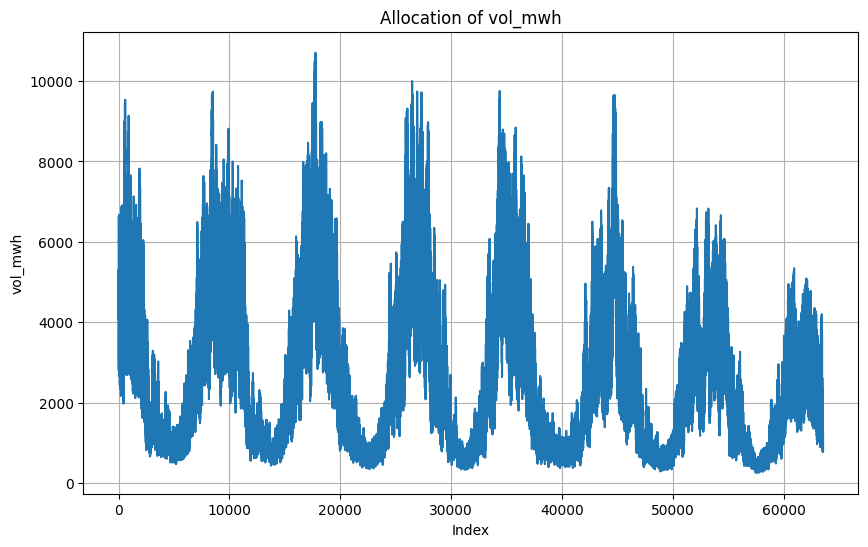

In [4]:
#plot allocation
plt.figure(figsize=(10, 6))
plt.plot(data['vol_mwh'])
plt.title('Allocation of vol_mwh')
plt.xlabel('Index')
plt.ylabel('vol_mwh')
plt.grid(True)
plt.show()

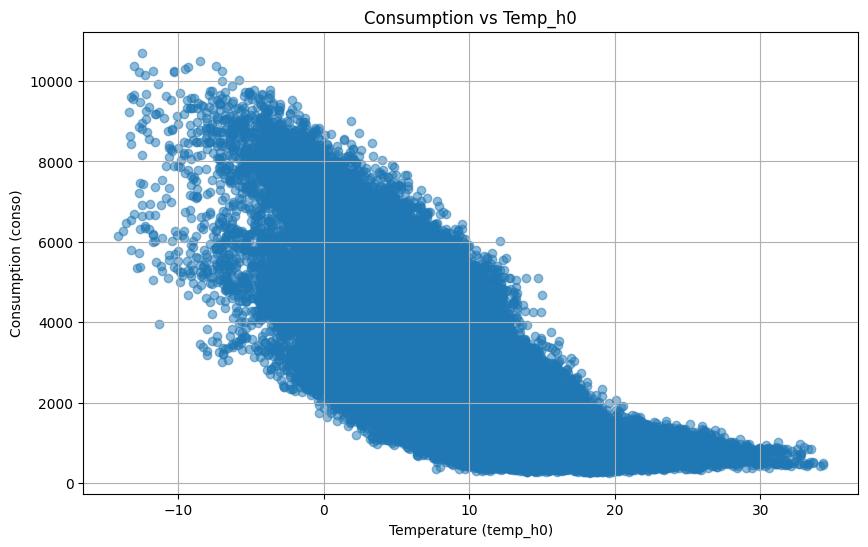

In [5]:
#Plot conso ~ temp_h0
plt.figure(figsize=(10, 6))
plt.scatter(data['temp_h0'], data['vol_mwh'], alpha=0.5)
plt.title('Consumption vs Temp_h0')
plt.xlabel('Temperature (temp_h0)')
plt.ylabel('Consumption (conso)')
plt.grid(True)
plt.show()

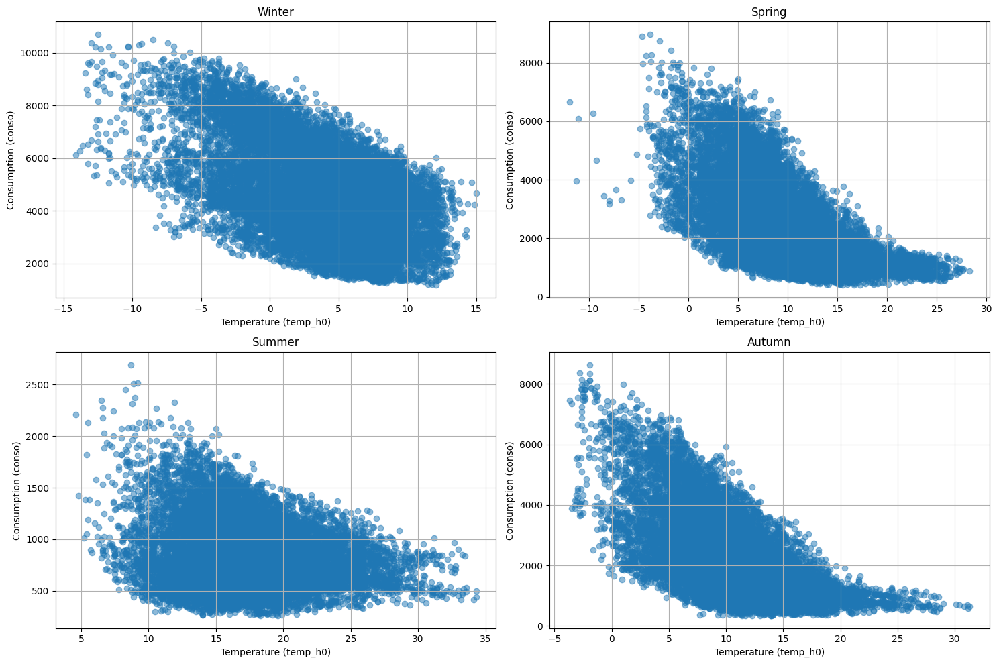

In [6]:
#consumption vs season
def get_season(month):
    if month in [12, 1, 2]:  # Winter: December, January, February
        return 'Winter'
    elif month in [3, 4, 5]:  # Spring: March, April, May
        return 'Spring'
    elif month in [6, 7, 8]:  # Summer: June, July, August
        return 'Summer'
    else:  # Autumn/Fall: September, October, November
        return 'Autumn'

# Apply the get_season function to create a new column 'season'
data['season'] = data['month'].apply(get_season)

# Plot conso vs temp_h0 for each season
fig, axs = plt.subplots(2, 2, figsize=(15, 10))  # Create a 2x2 grid of subplots

for i, season in enumerate(['Winter', 'Spring', 'Summer', 'Autumn']):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    
    # Filter data for the current season
    season_data = data[data['season'] == season]
    
    # Plot conso vs temp_h0 for the current season
    ax.scatter(season_data['temp_h0'], season_data['vol_mwh'], alpha=0.5)
    ax.set_title(season)
    ax.set_xlabel('Temperature (temp_h0)')
    ax.set_ylabel('Consumption (conso)')
    ax.grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

In [9]:
color_dict = {'Spring': 'green', 'Summer': 'red', 'Autumn': 'orange', 'Winter': 'blue'}
# Assign color based on season
data['Color'] = data['season'].map(color_dict)
def scatter_plot(col1, col2, startyear, startmonth, endyear, endmonth):
    #Filter for given timeframe
    df_filtered = data[((data['year_local'] == startyear) & (data['month_local'] >= startmonth)) |
                     ((data['year_local'] > startyear) & (data['year_local'] < endyear)) |
                     ((data['year_local'] == endyear) & (data['month_local'] <= endmonth))]

    print(df_filtered['season'].describe())
    # Scatter plot with colored data points
    plt.figure(figsize=(16, 9))
    plt.scatter(df_filtered[col1], df_filtered[col2], c=df_filtered['Color'], alpha=0.3)
    plt.xlabel(f"Temperature (°C)")
    plt.ylabel("Consommation de gaz (MWh)")
    plt.title(f'Consommation de gaz vs Temperature')
    # Create custom legend handles
    handles = [plt.Line2D([], [], marker='o', color='w', markersize=10, markerfacecolor=color, label=season) for season, color in color_dict.items()]
    plt.legend(handles=handles)
    plt.grid(True)
    plt.show()

count      19009
unique         4
top       Autumn
freq        5831
Name: season, dtype: object


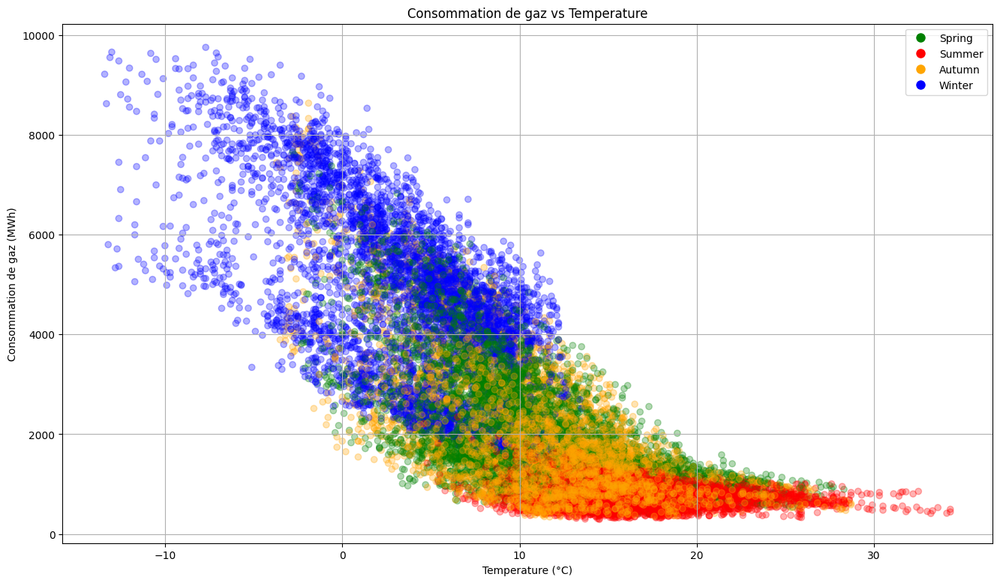

In [10]:
scatter_plot('temp_h0', 'vol_mwh', 2010, 9, 2012, 10)

<Figure size 640x480 with 0 Axes>

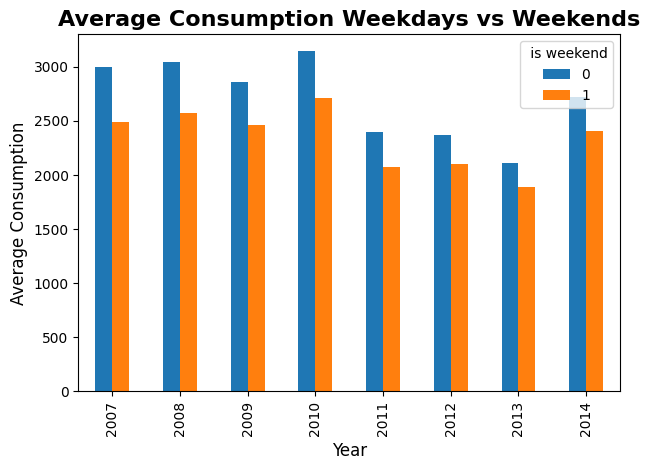

In [7]:
#for all the years
avg_gas = data.groupby(['year_local', 'weekend'])['vol_mwh'].mean().unstack()

# Plotting
plt.figure()
avg_gas.plot(kind='bar')
plt.title('Average Consumption Weekdays vs Weekends', fontsize=16, fontweight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Consumption', fontsize=12)
plt.legend(title=' is weekend')
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

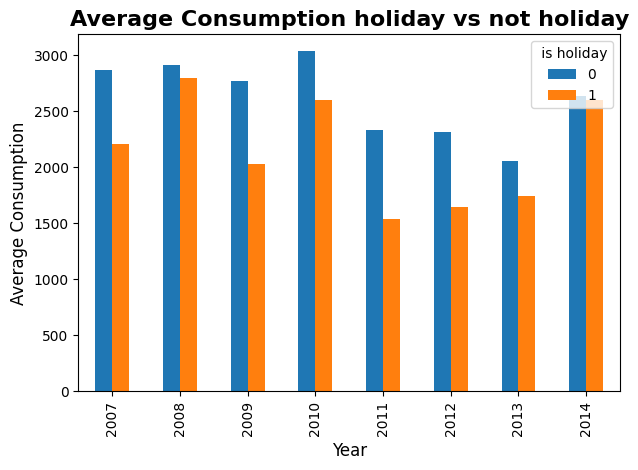

In [12]:
#for all the years
avg_gas = data.groupby(['year_local', 'Holiday'])['vol_mwh'].mean().unstack()

# Plotting
plt.figure()
avg_gas.plot(kind='bar')
plt.title('Average Consumption holiday vs not holiday', fontsize=16, fontweight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Consumption', fontsize=12)
plt.legend(title=' is holiday')
plt.tight_layout()
plt.show()

In [13]:
# Create new columns for each season and initialize them with zeros
data['winter'] = 0
data['summer'] = 0
data['spring'] = 0
data['autumn'] = 0

# Update the respective season column with 1 where the 'season' column matches
data.loc[data['season'] == 'Winter', 'winter'] = 1
data.loc[data['season'] == 'Summer', 'summer'] = 1
data.loc[data['season'] == 'Spring', 'spring'] = 1
data.loc[data['season'] == 'Autumn', 'autumn'] = 1


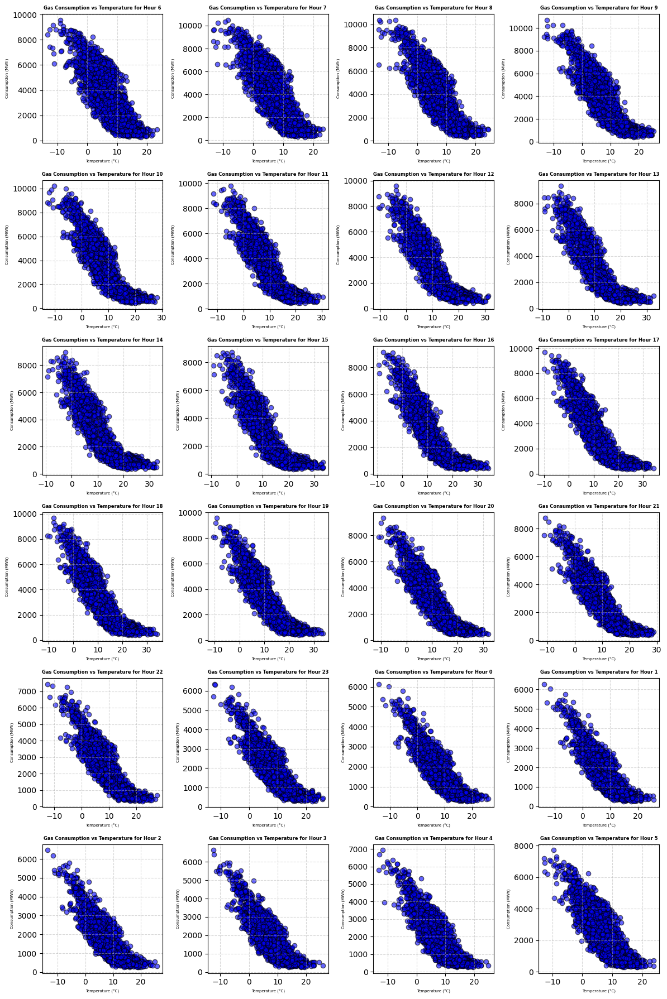

In [14]:


# Get unique hours in the 'hour' column
hours = data['hour_local'].unique()

# Calculate number of rows and columns for subplots
num_rows = (len(hours) + 1) // 4  # Adding 1 to round up if necessary
num_cols = 4

# Plotting
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 3*num_rows))

if num_rows == 1:
    axs = axs.reshape(1, -1)

# Iterate over each hour
for i, hour in enumerate(hours):
    # Compute subplot indices
    row_idx = i // num_cols
    col_idx = i % num_cols

    # Filter data for the current hour
    data_hour = data[data['hour_local'] == hour]
    axs[row_idx, col_idx].scatter(data_hour['temp_h0'], data_hour['vol_mwh'], alpha=0.6, c='blue', marker='o', edgecolors='black')
    axs[row_idx, col_idx].set_title(f'Gas Consumption vs Temperature for Hour {hour}', fontsize=6, fontweight='bold')
    axs[row_idx, col_idx].set_xlabel('Temperature (°C)', fontsize=5)
    axs[row_idx, col_idx].set_ylabel('Consumption (MWh)', fontsize=5)
    axs[row_idx, col_idx].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


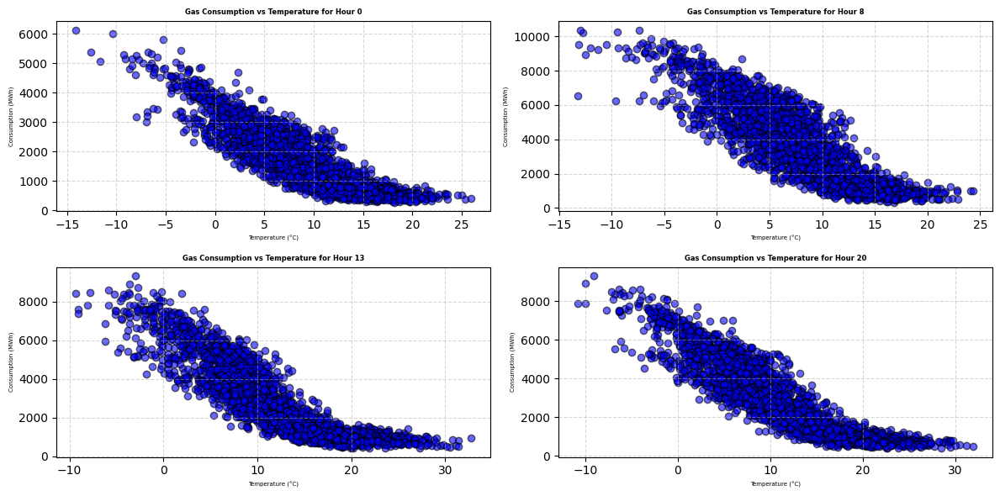

In [20]:


# Get unique hours in the 'hour' column

hours = [0,8, 13, 20]

# Calculate number of rows and columns for subplots
num_rows = 2 # Adding 1 to round up if necessary
num_cols = 2

# Plotting
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 3*num_rows))

if num_rows == 1:
    axs = axs.reshape(1, -1)

# Iterate over each hour
for i, hour in enumerate(hours):
    # Compute subplot indices
    row_idx = i // num_cols
    col_idx = i % num_cols

    # Filter data for the current hour
    data_hour = data[data['hour_local'] == hour]
    axs[row_idx, col_idx].scatter(data_hour['temp_h0'], data_hour['vol_mwh'], alpha=0.6, c='blue', marker='o', edgecolors='black')
    axs[row_idx, col_idx].set_title(f'Gas Consumption vs Temperature for Hour {hour}', fontsize=6, fontweight='bold')
    axs[row_idx, col_idx].set_xlabel('Temperature (°C)', fontsize=5)
    axs[row_idx, col_idx].set_ylabel('Consumption (MWh)', fontsize=5)
    axs[row_idx, col_idx].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


On peut observer une partie linéaire dans les plots , d'ou la piste d'utiliser une regression lineaire pour chaque heure 

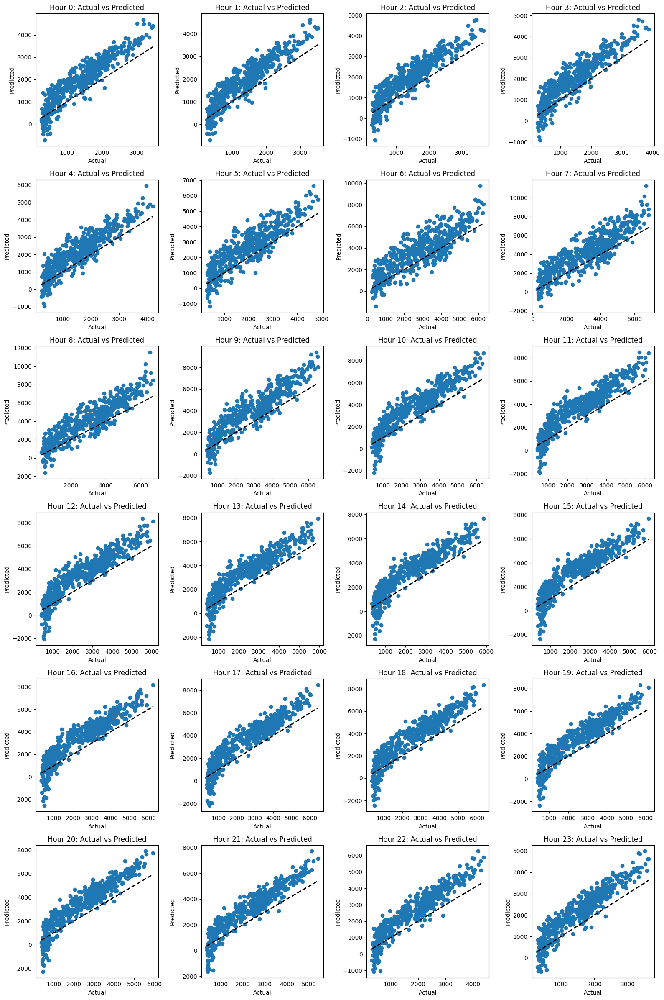

Mean values:
Hour                  1.150000e+01
R-squared             8.194668e-01
Adjusted R-squared    8.193814e-01
MSE                   1.318679e+06
RMSE                  1.117583e+03
WMAPE                 3.589500e+01
dtype: float64
    Hour  R-squared  Adjusted R-squared           MSE         RMSE  WMAPE
0      0   0.816744            0.816657  4.797980e+05   692.674554  36.69
1      1   0.809214            0.809124  4.590257e+05   677.514383  36.46
2      2   0.799764            0.799669  4.693141e+05   685.065058  36.16
3      3   0.790335            0.790236  4.950447e+05   703.594138  35.50
4      4   0.782456            0.782353  5.762609e+05   759.118525  34.44
5      5   0.761745            0.761632  8.478396e+05   920.782077  32.82
6      6   0.727731            0.727603  1.672868e+06  1293.393880  32.04
7      7   0.753651            0.753534  2.083805e+06  1443.539127  32.38
8      8   0.803046            0.802953  2.033113e+06  1425.872750  33.31
9      9   0.828194   

In [35]:
import numpy as np
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

target = 'vol_mwh'

# Assuming 'data' is your DataFrame
hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
  # Filter data for the current hour
  hour_data = data[data['hour_local'] == hour]
  

  features = ['temp_h0']
  
  # Define features and target variable for this hour's data
  X_hour = hour_data[features]
  y_hour = hour_data[target]
  
  # Split data into training and testing sets
  split_index = int(len(hour_data) * 0.8)
  X_train_hour, X_test_hour = X_hour.iloc[:split_index], X_hour.iloc[split_index:]
  y_train_hour, y_test_hour = y_hour.iloc[:split_index], y_hour.iloc[split_index:]
  
  # Fit the regression model
  X_train_const = sm.add_constant(X_train_hour)  # Add a constant term to the features
  model = sm.OLS(y_train_hour, X_train_const).fit()
  
  # Predict the target variable for the testing set
  X_test_const = sm.add_constant(X_test_hour)
  y_pred = model.predict(X_test_const)
  
  # Calculate evaluation metrics
  r_squared = model.rsquared
  adj_r_squared = model.rsquared_adj
  mse = mean_squared_error(y_test_hour, y_pred)
  rmse = np.sqrt(mse)
  # Calculating wMAPE
  wmape = np.sum(np.abs(y_pred - y_test_hour)) / np.sum((np.abs(y_pred) + np.abs(y_test_hour)) / 2)*100
  
  # Append results to the list
  results.append([hour, r_squared, adj_r_squared, mse, rmse,f'{wmape:.2f}%'])
  axs[i].scatter(y_test_hour, y_pred)
  axs[i].plot([y_test_hour.min(), y_test_hour.max()], [y_test_hour.min(), y_test_hour.max()], 'k--', lw=2)
  axs[i].set_xlabel('Actual')
  axs[i].set_ylabel('Predicted')
  axs[i].set_title(f'Hour {hour}: Actual vs Predicted')

# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Hour', 'R-squared', 'Adjusted R-squared', 'MSE', 'RMSE','WMAPE'])
# Convert 'WMAPE' column to numeric after removing '%' symbol
results_df['WMAPE'] = results_df['WMAPE'].str.rstrip('%').astype(float)

# Calculate the mean of each column
mean_values = results_df.mean()

print("Mean values:")
print(mean_values)

# Print the results
print(results_df)


but we notice after a certain temperature the consumption does not change , it maybe impacts the performance of our model

C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1162820555.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_filtered = data[data['hour_local'] == hour][data['temp_h0'] < t]
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1162820555.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_filtered = data[data['hour_local'] == hour][data['temp_h0'] < t]
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1162820555.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_filtered = data[data['hour_local'] == hour][data['temp_h0'] < t]
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1162820555.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_filtered = data[data['hour_local'] == hour][data['temp_h0'] < t]
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1162820555.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame inde

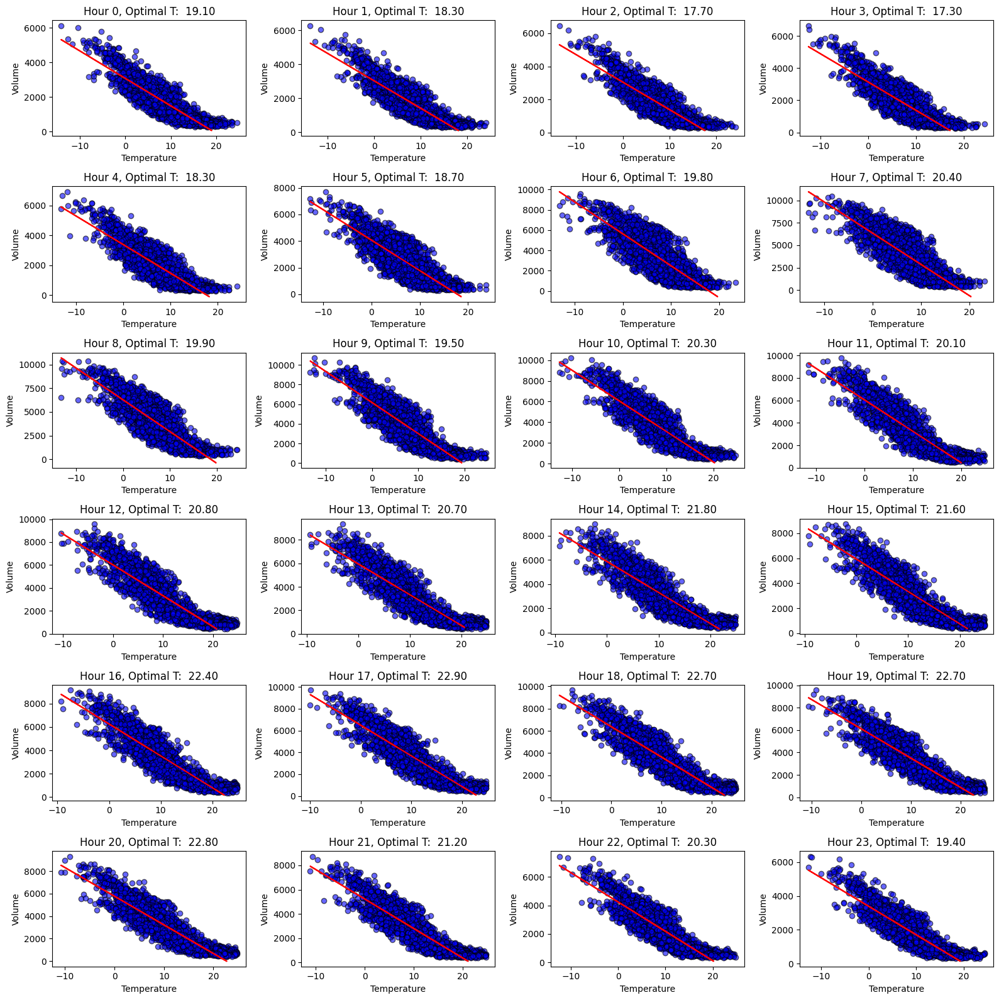

    Hour  Optimal T   Mean R²
0      0       19.1  0.780307
1      1       18.3  0.775858
2      2       17.7  0.768628
3      3       17.3  0.760774
4      4       18.3  0.751809
5      5       18.7  0.728836
6      6       19.8  0.695108
7      7       20.4  0.718551
8      8       19.9  0.764950
9      9       19.5  0.790566
10    10       20.3  0.805166
11    11       20.1  0.809213
12    12       20.8  0.806884
13    13       20.7  0.810536
14    14       21.8  0.815664
15    15       21.6  0.820837
16    16       22.4  0.829970
17    17       22.9  0.831225
18    18       22.7  0.832658
19    19       22.7  0.832539
20    20       22.8  0.827427
21    21       21.2  0.825824
22    22       20.3  0.814667
23    23       19.4  0.795138


In [17]:
# Create empty lists to store optimal_t values and mean R-squared values for each hour
optimal_t_values = [[] for _ in range(24)]
mean_r_squared_values = []

# Create a figure with subplots organized in a 6x4 grid
fig, axs = plt.subplots(6, 4, figsize=(16, 16))

# Iterate over each hour
for hour in range(24):
    max_r_squared = -float('inf')  # Initialize with negative infinity to ensure we find a maximum
    optimal_t_hour = None
    
    # Iterate over each threshold value from 10 to 25 with a step of 0.1
    for t in np.arange(10, 25, 0.1):
        data_filtered = data[data['hour_local'] == hour][data['temp_h0'] < t]
        
        # Check if there are still samples available after filtering
        if len(data_filtered) == 0:
            continue

        # Extract independent and dependent variables
        X = data_filtered['temp_h0'].values.reshape(-1, 1)
        y = data_filtered['vol_mwh'].values.reshape(-1, 1)

        # Fit linear regression model
        model = LinearRegression().fit(X, y)

        # Make predictions
        y_pred = model.predict(X)

        # Calculate R²
        r_squared = r2_score(y, y_pred)

        # Update optimal threshold if R² is maximized
        if r_squared > max_r_squared:
            max_r_squared = r_squared
            optimal_t_hour = t
    
    # Store the optimal threshold for the current hour
    optimal_t_values[hour] = optimal_t_hour
    mean_r_squared_values.append(max_r_squared)
    
    # Plot the regression line on the corresponding subplot
    ax = axs[hour // 4, hour % 4]
    ax.scatter(X, y,  alpha=0.6, c='blue', marker='o', edgecolors='black')
    ax.plot(X[X <= optimal_t_hour], y_pred[X <= optimal_t_hour], color='red')
    ax.set_title(f'Hour {hour}, Optimal T:  {optimal_t_hour:.2f}')
    ax.set_xlabel('Temperature')
    ax.set_ylabel('Volume')

# Adjust layout
plt.tight_layout()
plt.show()

# Create a DataFrame to display the results
results_df = pd.DataFrame({
    'Hour': range(24),
    'Optimal T': optimal_t_values,
    'Mean R²': mean_r_squared_values
})

# Display the results
print(results_df)

In [21]:
# Define a function to calculate min(temp_h0, optimal_t_values[i])
def calculate_min_temp(row):
    i = row['hour']
    if i < len(optimal_t_values):
        return min(row['temp_h0'], optimal_t_values[i])
    else:
        return row['temp_h0']

# Apply the function to create the new column 'temp_clipped_anass'
data['clipped_temp'] = data.apply(calculate_min_temp, axis=1)
print(data)

# Now you have the new column 'temp_clipped_anass' containing the desired values.

       year  month  day  hour  year_local  month_local  day_local  hour_local  \
0      2007      1    1     5        2007            1          1           6   
1      2007      1    1     6        2007            1          1           7   
2      2007      1    1     7        2007            1          1           8   
3      2007      1    1     8        2007            1          1           9   
4      2007      1    1     9        2007            1          1          10   
...     ...    ...  ...   ...         ...          ...        ...         ...   
63522  2014      3   31    23        2014            4          1           1   
63523  2014      4    1     0        2014            4          1           2   
63524  2014      4    1     1        2014            4          1           3   
63525  2014      4    1     2        2014            4          1           4   
63526  2014      4    1     3        2014            4          1           5   

       Monday  Tuesday  ...

In [22]:
print(data.columns)

Index(['year', 'month', 'day', 'hour', 'year_local', 'month_local',
       'day_local', 'hour_local', 'Monday', 'Tuesday',
       ...
       'temp_sup_morning_d1', 'temp_sup_afternoon_d1', 'temp_sup_evening_d1',
       'vol_mwh', 'season', 'Color', 'winter', 'spring', 'autumn',
       'clipped_temp'],
      dtype='object', length=201)


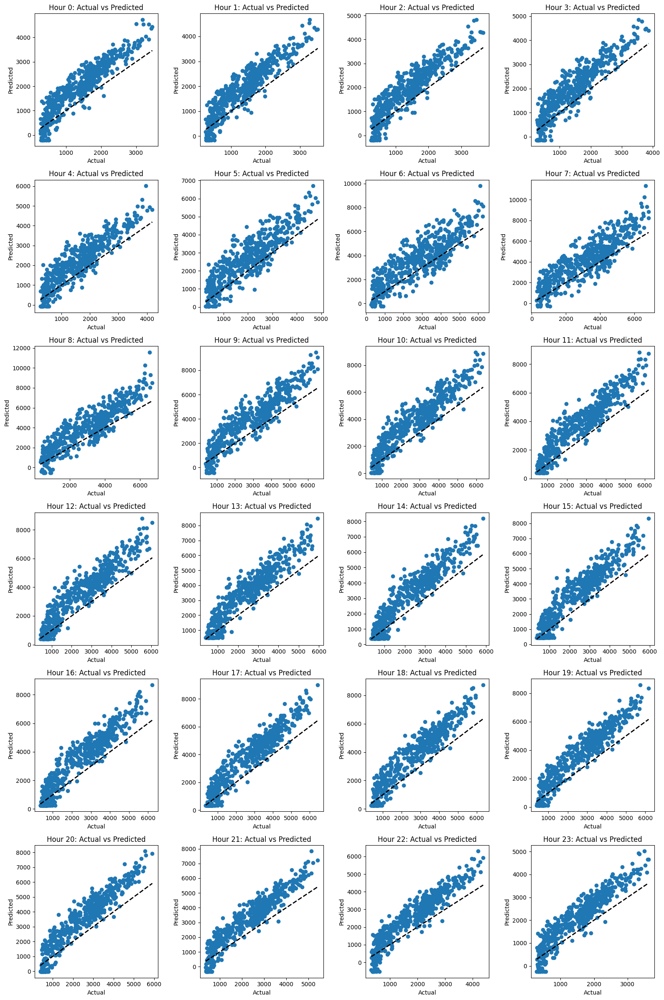

Mean values:
Hour                  1.150000e+01
R-squared             8.409198e-01
Adjusted R-squared    8.408446e-01
MSE                   1.324335e+06
RMSE                  1.119860e+03
WMAPE                 3.547708e+01
dtype: float64
    Hour  R-squared  Adjusted R-squared           MSE         RMSE  WMAPE
0      0   0.823728            0.823644  4.824255e+05   694.568561  36.77
1      1   0.817261            0.817175  4.617522e+05   679.523500  36.53
2      2   0.806982            0.806890  4.686168e+05   684.555936  36.15
3      3   0.798250            0.798155  4.951059e+05   703.637629  35.46
4      4   0.790603            0.790504  5.760814e+05   759.000289  34.38
5      5   0.768756            0.768646  8.464124e+05   920.006720  32.65
6      6   0.730951            0.730824  1.675774e+06  1294.516817  32.02
7      7   0.757018            0.756903  2.091321e+06  1446.140086  32.40
8      8   0.807060            0.806968  2.037744e+06  1427.495686  33.31
9      9   0.835347   

In [29]:
import numpy as np
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

target = 'vol_mwh'

# Assuming 'data' is your DataFrame
hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
  # Filter data for the current hour
  hour_data = data[data['hour_local'] == hour]
  

  features = ['clipped_temp']
  
  # Define features and target variable for this hour's data
  X_hour = hour_data[features]
  y_hour = hour_data[target]
  
  # Split data into training and testing sets
  split_index = int(len(hour_data) * 0.8)
  X_train_hour, X_test_hour = X_hour.iloc[:split_index], X_hour.iloc[split_index:]
  y_train_hour, y_test_hour = y_hour.iloc[:split_index], y_hour.iloc[split_index:]
  
  # Fit the regression model
  X_train_const = sm.add_constant(X_train_hour)  # Add a constant term to the features
  model = sm.OLS(y_train_hour, X_train_const).fit()
  
  # Predict the target variable for the testing set
  X_test_const = sm.add_constant(X_test_hour)
  y_pred = model.predict(X_test_const)
  
  # Calculate evaluation metrics
  r_squared = model.rsquared
  adj_r_squared = model.rsquared_adj
  mse = mean_squared_error(y_test_hour, y_pred)
  rmse = np.sqrt(mse)
  # Calculating wMAPE
  wmape = np.sum(np.abs(y_pred - y_test_hour)) / np.sum((np.abs(y_pred) + np.abs(y_test_hour)) / 2)*100
  
  # Append results to the list
  results.append([hour, r_squared, adj_r_squared, mse, rmse,f'{wmape:.2f}%'])
  axs[i].scatter(y_test_hour, y_pred)
  axs[i].plot([y_test_hour.min(), y_test_hour.max()], [y_test_hour.min(), y_test_hour.max()], 'k--', lw=2)
  axs[i].set_xlabel('Actual')
  axs[i].set_ylabel('Predicted')
  axs[i].set_title(f'Hour {hour}: Actual vs Predicted')

# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Hour', 'R-squared', 'Adjusted R-squared', 'MSE', 'RMSE','WMAPE'])
# Convert 'WMAPE' column to numeric after removing '%' symbol
results_df['WMAPE'] = results_df['WMAPE'].str.rstrip('%').astype(float)

# Calculate the mean of each column
mean_values = results_df.mean()

print("Mean values:")
print(mean_values)

# Print the results
print(results_df)


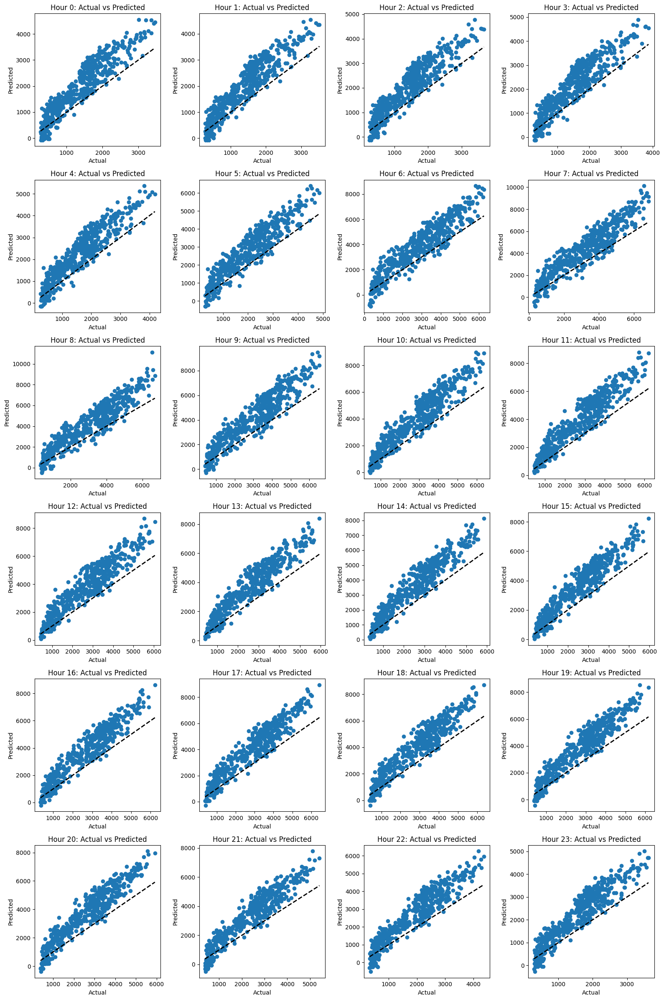

Mean values:
Hour                  1.150000e+01
R-squared             8.991734e-01
Adjusted R-squared    8.988844e-01
MSE                   1.355239e+06
RMSE                  1.135839e+03
WMAPE                 3.520167e+01
dtype: float64
    Hour  R-squared  Adjusted R-squared           MSE         RMSE  WMAPE
0      0   0.883005            0.882617  5.310288e+05   728.717198  36.69
1      1   0.879694            0.879352  5.069676e+05   712.016591  36.59
2      2   0.875999            0.875646  5.195879e+05   720.824464  36.52
3      3   0.873619            0.873260  5.531529e+05   743.742500  36.11
4      4   0.874574            0.874217  6.253916e+05   790.817061  35.00
5      5   0.872706            0.872344  8.490679e+05   921.448809  32.92
6      6   0.863174            0.862785  1.547647e+06  1244.044556  31.51
7      7   0.865372            0.864989  2.070835e+06  1439.039499  32.46
8      8   0.883956            0.883626  2.115977e+06  1454.639765  33.66
9      9   0.899981   

In [31]:
#we add now workweek seasons and holidays

target = 'vol_mwh'

# Assuming 'data' is your DataFrame
hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
  # Filter data for the current hour
  hour_data = data[data['hour_local'] == hour]
  

  features = ['clipped_temp','workweek','Holiday','spring','summer','autumn','winter','heating']
  
  # Define features and target variable for this hour's data
  X_hour = hour_data[features]
  y_hour = hour_data[target]
  
  # Split data into training and testing sets
  split_index = int(len(hour_data) * 0.8)
  X_train_hour, X_test_hour = X_hour.iloc[:split_index], X_hour.iloc[split_index:]
  y_train_hour, y_test_hour = y_hour.iloc[:split_index], y_hour.iloc[split_index:]
  
  # Fit the regression model
  X_train_const = sm.add_constant(X_train_hour)  # Add a constant term to the features
  model = sm.OLS(y_train_hour, X_train_const).fit()
  
  # Predict the target variable for the testing set
  X_test_const = sm.add_constant(X_test_hour)
  y_pred = model.predict(X_test_const)
  
  # Calculate evaluation metrics
  r_squared = model.rsquared
  adj_r_squared = model.rsquared_adj
  mse = mean_squared_error(y_test_hour, y_pred)
  rmse = np.sqrt(mse)
  # Calculating wMAPE
  wmape = np.sum(np.abs(y_pred - y_test_hour)) / np.sum((np.abs(y_pred) + np.abs(y_test_hour)) / 2)*100
  
  # Append results to the list
  results.append([hour, r_squared, adj_r_squared, mse, rmse,f'{wmape:.2f}%'])
  axs[i].scatter(y_test_hour, y_pred)
  axs[i].plot([y_test_hour.min(), y_test_hour.max()], [y_test_hour.min(), y_test_hour.max()], 'k--', lw=2)
  axs[i].set_xlabel('Actual')
  axs[i].set_ylabel('Predicted')
  axs[i].set_title(f'Hour {hour}: Actual vs Predicted')

# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Hour', 'R-squared', 'Adjusted R-squared', 'MSE', 'RMSE','WMAPE'])
# Convert 'WMAPE' column to numeric after removing '%' symbol
results_df['WMAPE'] = results_df['WMAPE'].str.rstrip('%').astype(float)

# Calculate the mean of each column
mean_values = results_df.mean()

print("Mean values:")
print(mean_values)

# Print the results
print(results_df)


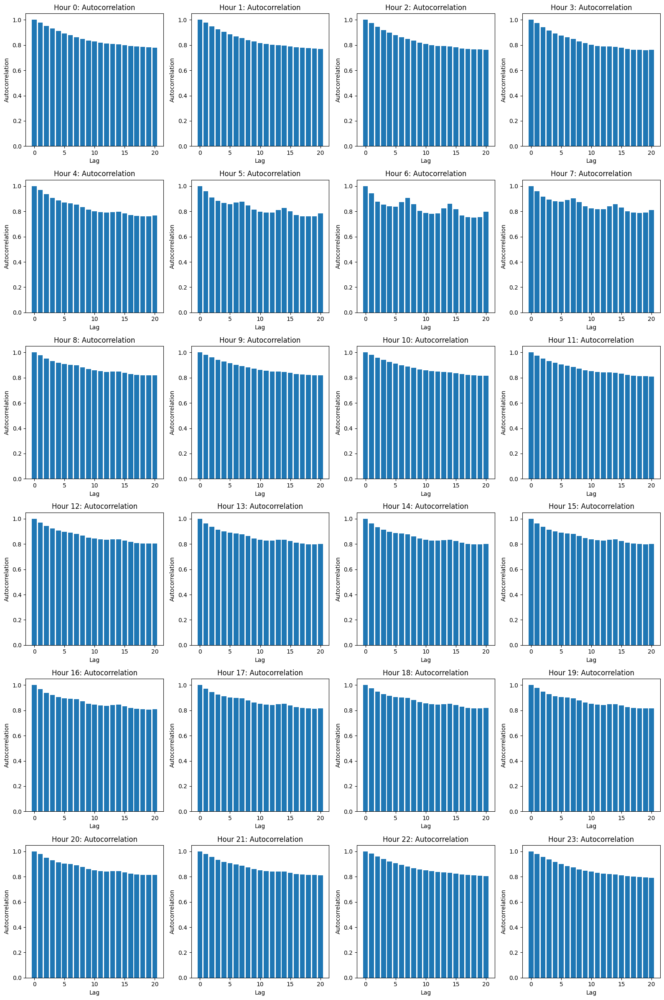

In [32]:
#autocorrelation :
hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
    # Filter data for the current hour
    hour_data = data[data['hour_local'] == hour]
    
    # Calculate autocorrelation
    autocorr = acf(hour_data[target], fft=True, nlags=20)
    
    # Plot autocorrelation
    axs[i].bar(range(len(autocorr)), autocorr)
    axs[i].set_xlabel('Lag')
    axs[i].set_ylabel('Autocorrelation')
    axs[i].set_title(f'Hour {hour}: Autocorrelation')
# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


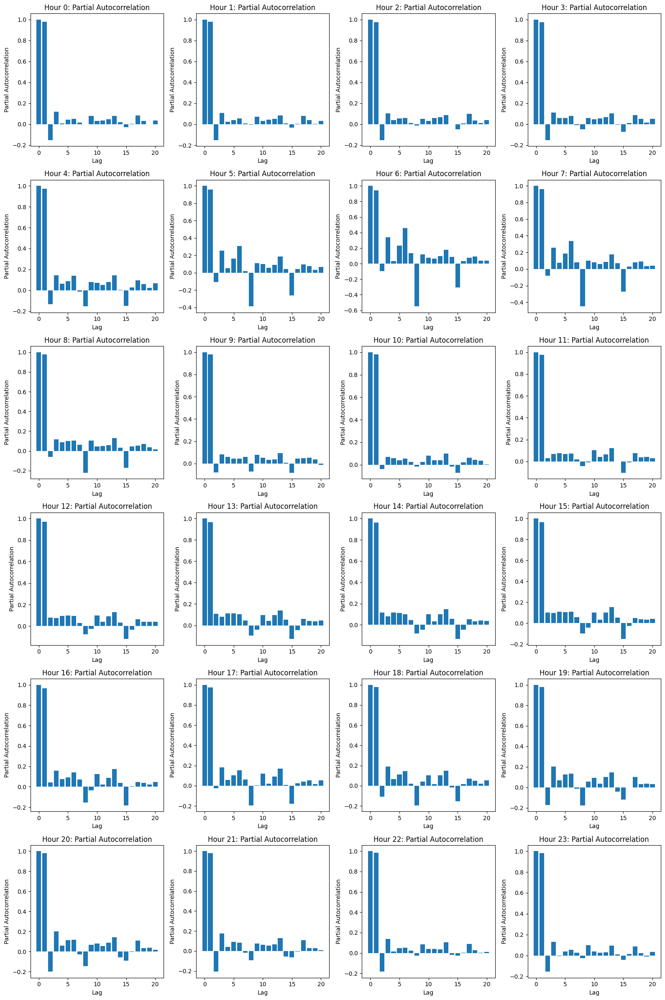

In [33]:
#not enough we will see the partial autocorrelation now
#autocorrelation :

hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
    # Filter data for the current hour
    hour_data = data[data['hour_local'] == hour]
    
    # Calculate autocorrelation
    pacorr = pacf(hour_data[target], nlags=20)
    
    axs[i].bar(range(len(pacorr)), pacorr)
    axs[i].set_xlabel('Lag')
    axs[i].set_ylabel('Partial Autocorrelation')
    axs[i].set_title(f'Hour {hour}: Partial Autocorrelation')
# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1340355683.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hour_data['vol_mwh_previous_hour_day_bef'] = hour_data['vol_mwh'].shift(24)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1340355683.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hour_data['vol_mwh_previous_hour_day_befbef'] = hour_data['vol_mwh'].shift(48)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1340355683.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy o

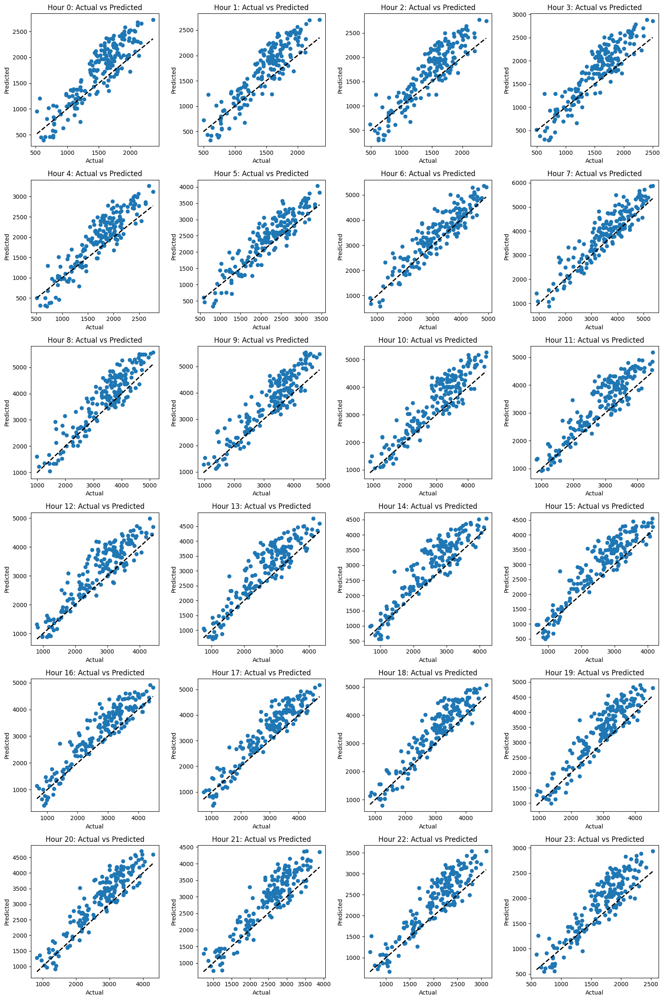

Mean values:
Hour                      11.500000
R-squared                  0.898482
Adjusted R-squared         0.897331
MSE                   265616.347058
RMSE                     506.027390
WMAPE                      0.158333
dtype: float64
    Hour  R-squared  Adjusted R-squared            MSE        RMSE  WMAPE
0      0   0.885322            0.883866  125328.872852  354.018182   0.19
1      1   0.880209            0.878859  123152.971745  350.931577   0.19
2      2   0.876274            0.874880  124407.017301  352.713789   0.18
3      3   0.875406            0.874002  133765.068166  365.739071   0.18
4      4   0.880662            0.879317  142745.165971  377.816312   0.17
5      5   0.884510            0.883208  159109.136331  398.884866   0.14
6      6   0.881190            0.879851  250619.003181  500.618620   0.12
7      7   0.889012            0.887762  296592.536490  544.603100   0.12
8      8   0.898228            0.897082  338929.494887  582.176515   0.13
9      9   0.904

In [41]:
#now we will add the consumption of the same hour for the 2 previous day to the model


# Assuming 'data' is your DataFrame
hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
  # Filter data for the current hour
  hour_data = data[data['hour_local'] == hour]
  # Add 'vol_mwh' from the hour 24 hours ago as a feature
  hour_data['vol_mwh_previous_hour_day_bef'] = hour_data['vol_mwh'].shift(24)
    
  # Add 'vol_mwh' from the hour 48 hours ago as a feature
  hour_data['vol_mwh_previous_hour_day_befbef'] = hour_data['vol_mwh'].shift(48)
  # Drop rows with NaN values (first hour of the dataset)
  hour_data.dropna(inplace=True)

  features = ['clipped_temp', 'heating','workweek', 'Holiday','winter','summer','spring','autumn','vol_mwh_previous_hour_day_bef','vol_mwh_previous_hour_day_befbef']
  
  # Define features and target variable for this hour's data
  X_hour = hour_data[features]
  y_hour = hour_data[target]
  
  # Split data into training and testing sets
  split_index = int(len(hour_data) * 0.8)
  X_train_hour, X_test_hour = X_hour.iloc[:split_index], X_hour.iloc[split_index:]
  y_train_hour, y_test_hour = y_hour.iloc[:split_index], y_hour.iloc[split_index:]
  
  # Fit the regression model
  X_train_const = sm.add_constant(X_train_hour)  # Add a constant term to the features
  model = sm.OLS(y_train_hour, X_train_const).fit()
  
  # Predict the target variable for the testing set
  X_test_const = sm.add_constant(X_test_hour)
  y_pred = model.predict(X_test_const)
  
  # Calculate evaluation metrics
  r_squared = model.rsquared
  adj_r_squared = model.rsquared_adj
  mse = mean_squared_error(y_test_hour, y_pred)
  rmse = np.sqrt(mse)
  # Calculating wMAPE
  wmape = np.sum(np.abs(y_pred - y_test_hour)) / np.sum((np.abs(y_pred) + np.abs(y_test_hour)) / 2)
  
  # Append results to the list
  results.append([hour, r_squared, adj_r_squared, mse, rmse,f'{wmape:.2f}%'])
  axs[i].scatter(y_test_hour, y_pred)
  axs[i].plot([y_test_hour.min(), y_test_hour.max()], [y_test_hour.min(), y_test_hour.max()], 'k--', lw=2)
  axs[i].set_xlabel('Actual')
  axs[i].set_ylabel('Predicted')
  axs[i].set_title(f'Hour {hour}: Actual vs Predicted')

# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Hour', 'R-squared', 'Adjusted R-squared', 'MSE', 'RMSE','WMAPE'])
# Convert 'WMAPE' column to numeric after removing '%' symbol
results_df['WMAPE'] = results_df['WMAPE'].str.rstrip('%').astype(float)

# Calculate the mean of each column
mean_values = results_df.mean()

print("Mean values:")
print(mean_values)

# Print the results
print(results_df)


C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\302592342.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  consumption_data['vol_mwh_previous_hour'] = consumption_data['vol_mwh'].shift(1)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\302592342.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  consumption_data.dropna(inplace=True)


Correlation coefficient between current hour's consumption and previous hour's consumption: 0.9826573346900356


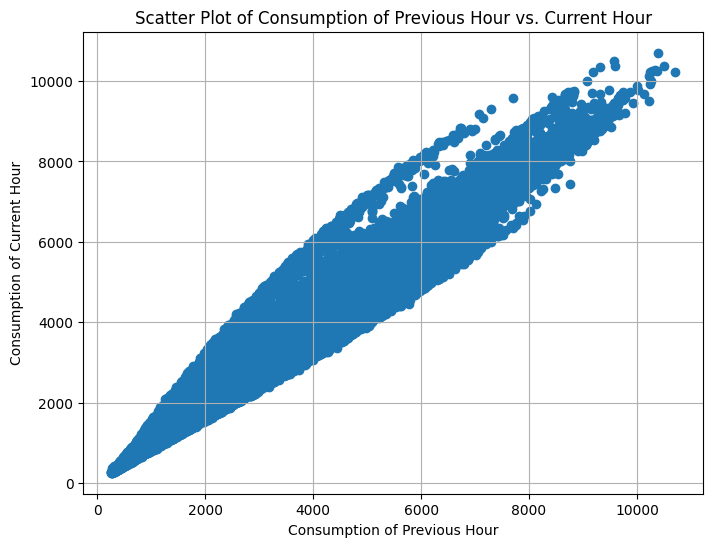

In [37]:

# Assuming 'data' is your DataFrame containing consumption data
# Filter data to include only relevant columns
consumption_data = data[['hour_local', 'vol_mwh']]

# Shift the 'vol_mwh' column to get the consumption of the previous hour
consumption_data['vol_mwh_previous_hour'] = consumption_data['vol_mwh'].shift(1)

# Drop NaN values resulting from shifting
consumption_data.dropna(inplace=True)

# Calculate correlation coefficient between current hour's consumption and previous hour's consumption
correlation = consumption_data['vol_mwh'].corr(consumption_data['vol_mwh_previous_hour'])

print("Correlation coefficient between current hour's consumption and previous hour's consumption:", correlation)
# Plot a scatter plot to visualize the relationship
plt.figure(figsize=(8, 6))
plt.scatter(x='vol_mwh_previous_hour', y='vol_mwh', data=consumption_data)
plt.title("Scatter Plot of Consumption of Previous Hour vs. Current Hour")
plt.xlabel("Consumption of Previous Hour")
plt.ylabel("Consumption of Current Hour")
plt.grid(True)
plt.show()


C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1963237530.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hour_data['vol_mwh_previous_hour'] = hour_data['vol_mwh'].shift(1)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1963237530.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hour_data['vol_mwh_previous_hour_day_bef'] = hour_data['vol_mwh'].shift(24)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1963237530.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

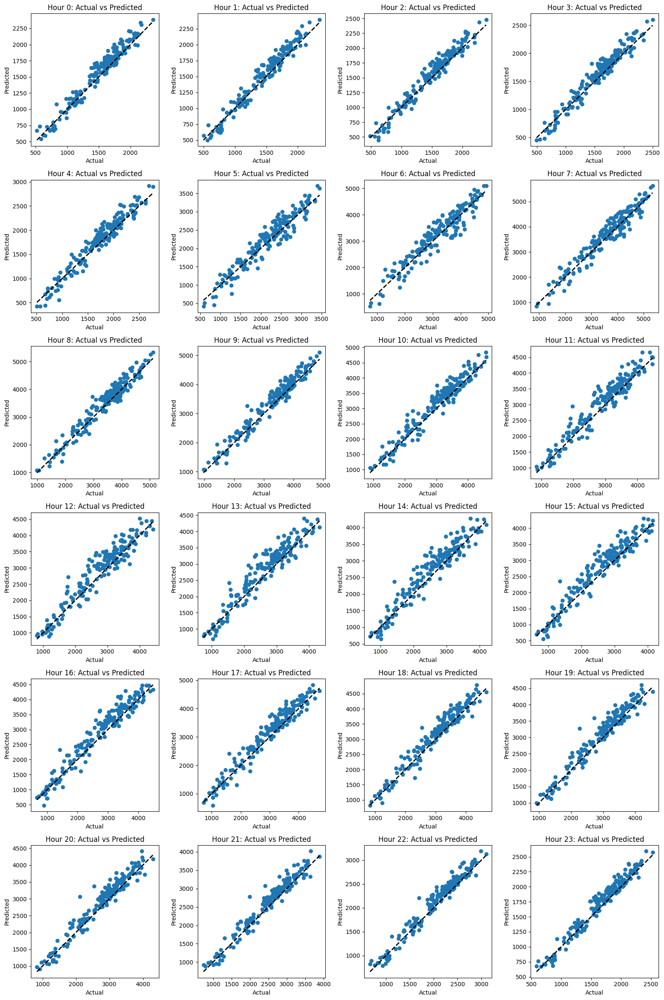

Mean values:
Hour                     11.500000
R-squared                 0.971585
Adjusted R-squared        0.971223
MSE                   57325.875678
RMSE                    227.767300
WMAPE                     0.070000
dtype: float64
    Hour  R-squared  Adjusted R-squared            MSE        RMSE  WMAPE
0      0   0.976323            0.975989   12414.703250  111.421287   0.06
1      1   0.976179            0.975877   12124.549991  110.111534   0.06
2      2   0.976003            0.975698   13037.612969  114.182367   0.06
3      3   0.975856            0.975549   15743.715981  125.473965   0.06
4      4   0.974544            0.974221   22037.938454  148.451805   0.07
5      5   0.967319            0.966904   44901.745367  211.900319   0.08
6      6   0.957473            0.956933   98199.974499  313.368752   0.08
7      7   0.970518            0.970144   78366.482387  279.940141   0.06
8      8   0.978962            0.978695   58463.122426  241.791485   0.06
9      9   0.979114   

In [43]:
#now we will add the consumption of the same hour for the 2 previous day to the model


# Assuming 'data' is your DataFrame
hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
  # Filter data for the current hour
  hour_data = data[data['hour_local'] == hour]
  # Add 'vol_mwh' from the hour 24 hours ago as a feature
  hour_data['vol_mwh_previous_hour'] = hour_data['vol_mwh'].shift(1)
  hour_data['vol_mwh_previous_hour_day_bef'] = hour_data['vol_mwh'].shift(24)
    
  # Add 'vol_mwh' from the hour 48 hours ago as a feature
  hour_data['vol_mwh_previous_hour_day_befbef'] = hour_data['vol_mwh'].shift(48)
  # Drop rows with NaN values (first hour of the dataset)
  hour_data.dropna(inplace=True)

  features = ['clipped_temp', 'heating','workweek', 'Holiday','winter','summer','spring','autumn','vol_mwh_previous_hour_day_bef','vol_mwh_previous_hour_day_befbef','vol_mwh_previous_hour']
  
  # Define features and target variable for this hour's data
  X_hour = hour_data[features]
  y_hour = hour_data[target]
  
  # Split data into training and testing sets
  split_index = int(len(hour_data) * 0.8)
  X_train_hour, X_test_hour = X_hour.iloc[:split_index], X_hour.iloc[split_index:]
  y_train_hour, y_test_hour = y_hour.iloc[:split_index], y_hour.iloc[split_index:]
  
  # Fit the regression model
  X_train_const = sm.add_constant(X_train_hour)  # Add a constant term to the features
  model = sm.OLS(y_train_hour, X_train_const).fit()
  
  # Predict the target variable for the testing set
  X_test_const = sm.add_constant(X_test_hour)
  y_pred = model.predict(X_test_const)
  
  # Calculate evaluation metrics
  r_squared = model.rsquared
  adj_r_squared = model.rsquared_adj
  mse = mean_squared_error(y_test_hour, y_pred)
  rmse = np.sqrt(mse)
  # Calculating wMAPE
  wmape = np.sum(np.abs(y_pred - y_test_hour)) / np.sum((np.abs(y_pred) + np.abs(y_test_hour)) / 2)
  
  # Append results to the list
  results.append([hour, r_squared, adj_r_squared, mse, rmse,f'{wmape:.2f}%'])
  axs[i].scatter(y_test_hour, y_pred)
  axs[i].plot([y_test_hour.min(), y_test_hour.max()], [y_test_hour.min(), y_test_hour.max()], 'k--', lw=2)
  axs[i].set_xlabel('Actual')
  axs[i].set_ylabel('Predicted')
  axs[i].set_title(f'Hour {hour}: Actual vs Predicted')

# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Hour', 'R-squared', 'Adjusted R-squared', 'MSE', 'RMSE','WMAPE'])
# Convert 'WMAPE' column to numeric after removing '%' symbol
results_df['WMAPE'] = results_df['WMAPE'].str.rstrip('%').astype(float)

# Calculate the mean of each column
mean_values = results_df.mean()

print("Mean values:")
print(mean_values)

# Print the results
print(results_df)


NOW we will try to improve the model, by adding extra feature from the dataset, since it has 195 columns we will try to narrow the selection

In [46]:
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression


# Drop non-numerical columns
numerical_data = data.select_dtypes(include=['float64'])

# Drop columns that contain NaN values
numerical_data = numerical_data.dropna(axis=1)

# Define your target variable
target = 'vol_mwh'

# Define independent variables (features)
X = numerical_data.drop(columns=[target])

# Define the target variable
y = numerical_data[target]

# Initialize the linear regression model
model = LinearRegression()

# Initialize the RFE
rfe = RFE(model, n_features_to_select=10)  # Choose the number of features you want to select

# Fit RFE
rfe.fit(X, y)

# Get selected features
selected_features = X.columns[rfe.support_]

print("Selected Features:")
print(selected_features)


Selected Features:
Index(['temp_h0', 'dewp_h0', 'temp_h1_h24', 'temp_clip', 'temp_sup',
       'temp_clip_h1_h24', 'temp_sup_h1_h24', 'temp_d0', 'dewp_d0', 'rh_d0'],
      dtype='object')


C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1758628940.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hour_data['vol_mwh_previous_hour'] = hour_data['vol_mwh'].shift(1)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1758628940.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hour_data['vol_mwh_previous_hour_day_bef'] = hour_data['vol_mwh'].shift(24)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\1758628940.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

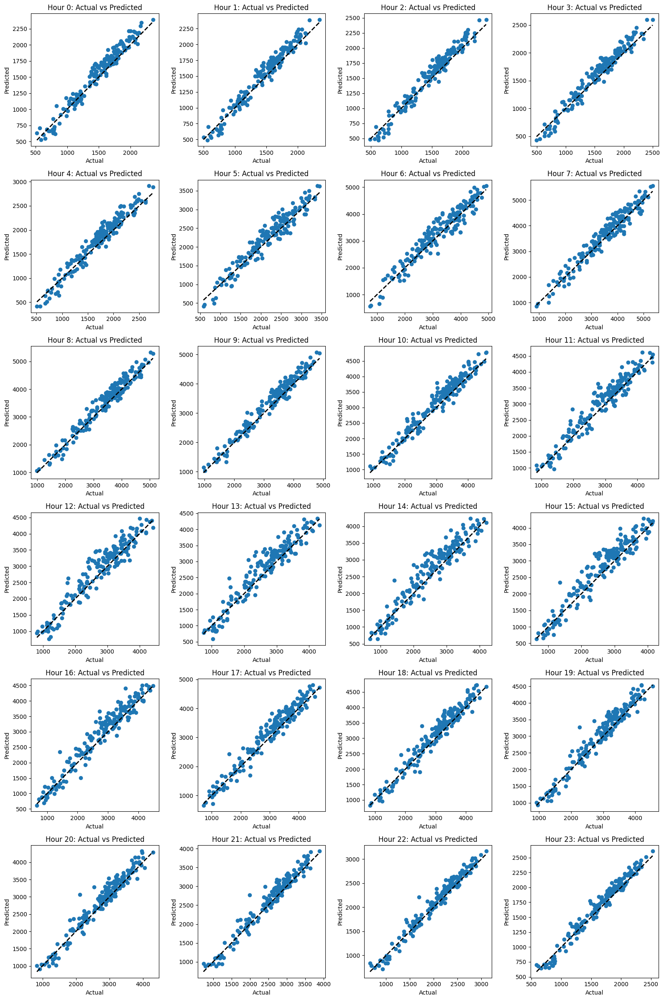

Mean values:
Hour                     11.500000
R-squared                 0.976278
Adjusted R-squared        0.975736
MSE                   52580.043854
RMSE                    217.737427
WMAPE                     0.067083
dtype: float64
    Hour  R-squared  Adjusted R-squared           MSE        RMSE  WMAPE
0      0   0.980278            0.979800  12818.266004  113.217781   0.06
1      1   0.980328            0.979880  12562.692587  112.083418   0.06
2      2   0.980224            0.979773  13398.179561  115.750506   0.06
3      3   0.979857            0.979398  16081.509859  126.812893   0.07
4      4   0.978373            0.977880  21927.505216  148.079388   0.07
5      5   0.971848            0.971206  41943.379882  204.800830   0.08
6      6   0.962646            0.961794  87845.428375  296.387295   0.08
7      7   0.973824            0.973227  73323.595566  270.783300   0.06
8      8   0.981661            0.981243  52450.713935  229.021208   0.05
9      9   0.982271            0

In [47]:
#now we will add the consumption of the same hour for the 2 previous day to the model


# Assuming 'data' is your DataFrame
hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
  # Filter data for the current hour
  hour_data = data[data['hour_local'] == hour]
  # Add 'vol_mwh' from the hour 24 hours ago as a feature
  hour_data['vol_mwh_previous_hour'] = hour_data['vol_mwh'].shift(1)
  hour_data['vol_mwh_previous_hour_day_bef'] = hour_data['vol_mwh'].shift(24)
    
  # Add 'vol_mwh' from the hour 48 hours ago as a feature
  hour_data['vol_mwh_previous_hour_day_befbef'] = hour_data['vol_mwh'].shift(48)
  # Drop rows with NaN values (first hour of the dataset)
  hour_data.dropna(inplace=True)

  features = ['clipped_temp', 'heating','workweek', 'Holiday','winter','summer','spring','autumn','vol_mwh_previous_hour_day_bef','vol_mwh_previous_hour_day_befbef','vol_mwh_previous_hour','temp_h0', 'dewp_h0', 'temp_h1_h24', 'temp_clip', 'temp_sup','temp_clip_h1_h24', 'temp_sup_h1_h24', 'temp_d0', 'dewp_d0', 'rh_d0']
  
  # Define features and target variable for this hour's data
  X_hour = hour_data[features]
  y_hour = hour_data[target]
  
  # Split data into training and testing sets
  split_index = int(len(hour_data) * 0.8)
  X_train_hour, X_test_hour = X_hour.iloc[:split_index], X_hour.iloc[split_index:]
  y_train_hour, y_test_hour = y_hour.iloc[:split_index], y_hour.iloc[split_index:]
  
  # Fit the regression model
  X_train_const = sm.add_constant(X_train_hour)  # Add a constant term to the features
  model = sm.OLS(y_train_hour, X_train_const).fit()
  
  # Predict the target variable for the testing set
  X_test_const = sm.add_constant(X_test_hour)
  y_pred = model.predict(X_test_const)
  
  # Calculate evaluation metrics
  r_squared = model.rsquared
  adj_r_squared = model.rsquared_adj
  mse = mean_squared_error(y_test_hour, y_pred)
  rmse = np.sqrt(mse)
  # Calculating wMAPE
  wmape = np.sum(np.abs(y_pred - y_test_hour)) / np.sum((np.abs(y_pred) + np.abs(y_test_hour)) / 2)
  
  # Append results to the list
  results.append([hour, r_squared, adj_r_squared, mse, rmse,f'{wmape:.2f}%'])
  axs[i].scatter(y_test_hour, y_pred)
  axs[i].plot([y_test_hour.min(), y_test_hour.max()], [y_test_hour.min(), y_test_hour.max()], 'k--', lw=2)
  axs[i].set_xlabel('Actual')
  axs[i].set_ylabel('Predicted')
  axs[i].set_title(f'Hour {hour}: Actual vs Predicted')

# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Hour', 'R-squared', 'Adjusted R-squared', 'MSE', 'RMSE','WMAPE'])
# Convert 'WMAPE' column to numeric after removing '%' symbol
results_df['WMAPE'] = results_df['WMAPE'].str.rstrip('%').astype(float)

# Calculate the mean of each column
mean_values = results_df.mean()

print("Mean values:")
print(mean_values)

# Print the results
print(results_df)


C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\3975092607.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hour_data['vol_mwh_previous_hour'] = hour_data['vol_mwh'].shift(1)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\3975092607.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hour_data['vol_mwh_previous_hour_day_bef'] = hour_data['vol_mwh'].shift(24)
C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\3975092607.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

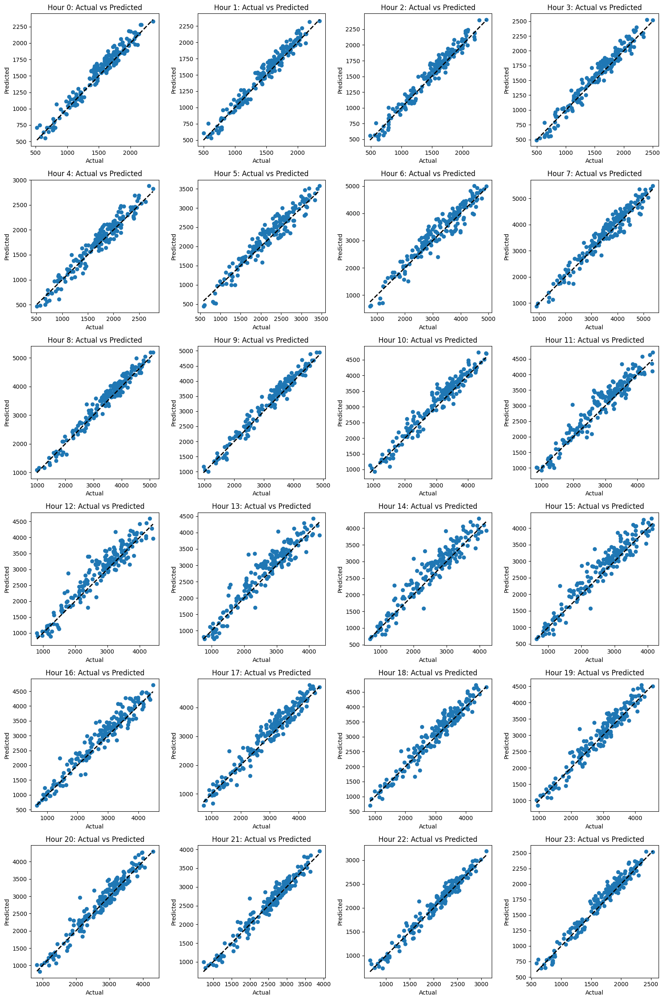

Mean values:
Hour                     11.500000
R-squared                 0.977820
Adjusted R-squared        0.977288
MSE                   49375.033569
RMSE                    207.880688
WMAPE                     6.337500
dtype: float64
    Hour  R-squared  Adjusted R-squared            MSE        RMSE  WMAPE
0      0   0.976874            0.976515    9667.772904   98.324834   5.14
1      1   0.977248            0.976927    8614.296581   92.813235   5.05
2      2   0.977421            0.977102    8728.663374   93.427316   4.95
3      3   0.977343            0.977023   10848.411045  104.155706   5.47
4      4   0.975251            0.974902   17886.097363  133.738915   6.32
5      5   0.974677            0.974026   39671.112331  199.176084   7.44
6      6   0.965138            0.964241   87303.935937  295.472395   7.49
7      7   0.976943            0.976350   68460.080300  261.648773   6.01
8      8   0.985271            0.984893   38853.214281  197.112187   4.63
9      9   0.984882   

In [74]:
#final model :
#now we will add the consumption of the same hour for the 2 previous day to the model
target = 'vol_mwh'

# Assuming 'data' is your DataFrame
hours = np.unique(data['hour_local'])
# Calculate the number of rows needed for the subplots
num_rows = (len(hours) + 3) // 4

# Create subplots
fig, axs = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))

# Flatten the axs array to iterate over all subplots
axs = axs.flatten()
# Initialize lists to store results
results = []

for i,hour in enumerate(hours):
  # Filter data for the current hour
  hour_data = data[data['hour_local'] == hour]
  hour_data['vol_mwh_previous_hour'] = hour_data['vol_mwh'].shift(1)
  # Add 'vol_mwh' from the hour 24 hours ago as a feature
  hour_data['vol_mwh_previous_hour_day_bef'] = hour_data['vol_mwh'].shift(24)
    
  # Add 'vol_mwh' from the hour 48 hours ago as a feature
  hour_data['vol_mwh_previous_hour_day_befbef'] = hour_data['vol_mwh'].shift(48)
  # Drop rows with NaN values (first hour of the dataset)
  hour_data.dropna(inplace=True)

  if hour in [23, 0, 1, 2, 3, 4]:
    features = [ 'temp_clip_night_d1', 'heating', 'workweek', 'Holiday', 'winter', 'summer', 'spring', 'autumn', 'vol_mwh_previous_hour_day_bef', 'vol_mwh_previous_hour_day_befbef', 'vol_mwh_previous_hour','temp_h0']
  elif hour in [5, 6, 7, 8, 9, 10]:
    features = ['clipped_temp', 'temp_clip_morning_d1', 'temp_clip_night_d1','heating', 'workweek', 'Holiday', 'winter', 'summer', 'spring', 'autumn', 'vol_mwh_previous_hour_day_bef', 'vol_mwh_previous_hour_day_befbef', 'vol_mwh_previous_hour','temp_h0', 'dewp_h0', 'temp_h1_h24', 'temp_clip', 'temp_sup','temp_clip_h1_h24', 'temp_sup_h1_h24', 'temp_d0', 'dewp_d0', 'rh_d0']
  elif hour in [11, 12, 13, 14, 15, 16]:
   features = ['clipped_temp', 'temp_clip_afternoon_d1', 'temp_clip_night_d1','temp_clip_evening_d1','temp_clip_morning_d1','heating', 'workweek', 'Holiday', 'winter', 'summer', 'spring', 'autumn', 'vol_mwh_previous_hour_day_bef', 'vol_mwh_previous_hour_day_befbef', 'vol_mwh_previous_hour','temp_h0', 'dewp_h0', 'temp_h1_h24', 'temp_clip', 'temp_sup','temp_clip_h1_h24', 'temp_sup_h1_h24', 'temp_d0', 'dewp_d0', 'rh_d0']
  elif hour in [17, 18, 19, 20, 21, 22]:
    features = ['clipped_temp', 'temp_clip_evening_d1','temp_clip_morning_d1','temp_clip_night_d1','heating', 'workweek', 'Holiday', 'winter', 'summer', 'spring', 'autumn', 'vol_mwh_previous_hour_day_bef', 'vol_mwh_previous_hour_day_befbef', 'vol_mwh_previous_hour','temp_h0', 'dewp_h0', 'temp_h1_h24', 'temp_clip', 'temp_sup','temp_clip_h1_h24', 'temp_sup_h1_h24', 'temp_d0', 'dewp_d0', 'rh_d0']
    
  
  # Define features and target variable for this hour's data
  X_hour = hour_data[features]
  y_hour = hour_data[target]
  
  # Split data into training and testing sets
  split_index = int(len(hour_data) * 0.8)
  X_train_hour, X_test_hour = X_hour.iloc[:split_index], X_hour.iloc[split_index:]
  y_train_hour, y_test_hour = y_hour.iloc[:split_index], y_hour.iloc[split_index:]
  
  # Fit the regression model
  X_train_const = sm.add_constant(X_train_hour)  # Add a constant term to the features
  model = sm.OLS(y_train_hour, X_train_const).fit()
  
  # Predict the target variable for the testing set
  X_test_const = sm.add_constant(X_test_hour)
  y_pred = model.predict(X_test_const)
  
  # Calculate evaluation metrics
  r_squared = model.rsquared
  adj_r_squared = model.rsquared_adj
  mse = mean_squared_error(y_test_hour, y_pred)
  rmse = np.sqrt(mse)
  # Calculating wMAPE
  wmape = np.sum(np.abs(y_pred - y_test_hour)) / np.sum((np.abs(y_pred) + np.abs(y_test_hour)) / 2)*100
  
  # Append results to the list
  results.append([hour, r_squared, adj_r_squared, mse, rmse,f'{wmape:.2f}%'])
  axs[i].scatter(y_test_hour, y_pred)
  axs[i].plot([y_test_hour.min(), y_test_hour.max()], [y_test_hour.min(), y_test_hour.max()], 'k--', lw=2)
  axs[i].set_xlabel('Actual')
  axs[i].set_ylabel('Predicted')
  axs[i].set_title(f'Hour {hour}: Actual vs Predicted')

# Hide the empty subplots
for i in range(len(hours), num_rows * 4):
    axs[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

# Create a DataFrame from the results
results_df = pd.DataFrame(results, columns=['Hour', 'R-squared', 'Adjusted R-squared', 'MSE', 'RMSE','WMAPE'])
# Convert 'WMAPE' column to numeric after removing '%' symbol
results_df['WMAPE'] = results_df['WMAPE'].str.rstrip('%').astype(float)

# Calculate the mean of each column
mean_values = results_df.mean()

print("Mean values:")
print(mean_values)

# Print the results
print(results_df)


In [64]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LinearRegression



# Define your target variable
target = 'vol_mwh'

# Define the hours between 11 and 16
hours = [11, 12, 13, 14, 15, 16]

# Filter data for these hours
filtered_data = data[data['hour_local'].isin(hours)]

# Define all numerical columns
numerical_features = filtered_data.select_dtypes(include=['float64']).columns.tolist()

# Remove the target variable from features
numerical_features.remove(target)

# Drop rows with NaN values
filtered_data.dropna(subset=numerical_features + [target], inplace=True)

# Define X and y
X = filtered_data[numerical_features]
y = filtered_data[target]

# Initialize the linear regression model
model = LinearRegression()

# Initialize RFECV
rfecv = RFECV(estimator=model, scoring='neg_mean_squared_error')

# Fit RFECV
rfecv.fit(X, y)

# Get selected features
selected_features = X.columns[rfecv.support_]

print("Selected Features:")
print(selected_features)


C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\651410805.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.dropna(subset=numerical_features + [target], inplace=True)


Selected Features:
Index(['temp_h1_h24', 'temp_sup_h1_h24', 'temp_d0', 'dewp_d0', 'rh_d0'], dtype='object')


In [69]:
import pandas as pd
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
import numpy as np



# Define your target variable
target = 'vol_mwh'

# Define the hours between 11 and 16
hours = [11, 12, 13, 14, 15, 16]

# Filter data for these hours
filtered_data = data[data['hour_local'].isin(hours)]

# Define all numerical columns
numerical_features = filtered_data.select_dtypes(include=['float64']).columns.tolist()

# Remove the target variable from features
numerical_features.remove(target)

# Drop rows with NaN values
filtered_data.dropna(subset=numerical_features + [target], inplace=True)

# Define X and y
X = filtered_data[numerical_features]
y = filtered_data[target]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Lasso regression model
lasso = Lasso(alpha=0.1)  # You can adjust the regularization parameter alpha

# Fit Lasso model
lasso.fit(X_train, y_train)

# Get selected features
selected_features = X.columns[lasso.coef_ != 0]

print("Selected Features:")
print(selected_features)


C:\Users\DELL\AppData\Local\Temp\ipykernel_10952\357442215.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.dropna(subset=numerical_features + [target], inplace=True)


Selected Features:
Index(['temp_h0', 'dewp_h0', 'wind', 'rad', 'rain', 'temp_h1', 'temp_h2',
       'temp_h3', 'temp_hp1', 'temp_hp2', 'temp_hp3', 'temp_h1_h24',
       'temp_h25_h48', 'temp_h49_h72', 'temp_h1_h6', 'temp_h7_h12',
       'temp_hp1_hp6', 'rh_h0', 'temp_clip', 'temp_inf', 'temp_sup',
       'temp_clip_h1_h24', 'temp_inf_h1_h24', 'temp_clip_h1_h6',
       'temp_clip_hp1_hp6', 'temp_clip_d0', 'temp_clip_d1', 'temp_clip_d2',
       'temp_clip_d3', 'temp_clip_d7_d1', 'temp_clip_d14_d8',
       'temp_clip_d21_d15', 'temp_d0', 'temp_d1', 'temp_d2', 'temp_d3',
       'temp_d7_d1', 'temp_d14_d8', 'temp_d21_d15', 'temp_max_d0',
       'temp_min_d0', 'temp_max_d1', 'temp_min_d1', 'temp_max_d2',
       'temp_min_d2', 'temp_max_d3', 'temp_min_d3', 'min_temp_min_d1',
       'min_temp_max_d1', 'min_temp_d1', 'cc_d0', 'cc_d1', 'rad_d0', 'rad_d1',
       'dewp_d0', 'wind_d0', 'rh_d0', 'rain_d0', 'temp_fall1', 'temp_fall2',
       'temp_fall3', 'temp_fall4', 'temp_spring1', 'temp_spring2'

C:\Users\DELL\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.075e+08, tolerance: 1.043e+06
  model = cd_fast.enet_coordinate_descent(
